In [4]:
import numpy as np
from scipy import signal, misc, ndimage
from skimage import filters, feature, img_as_float
from skimage.io import imread
from skimage.color import rgb2gray
from PIL import Image, ImageFilter
import matplotlib.pylab as pyla
import pylab

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_36072\915898269.py:26: RuntimeWarning: divide by zero encountered in divide
  im_dir = np.arctan(im_y/im_x)
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_36072\915898269.py:26: RuntimeWarning: invalid value encountered in divide
  im_dir = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

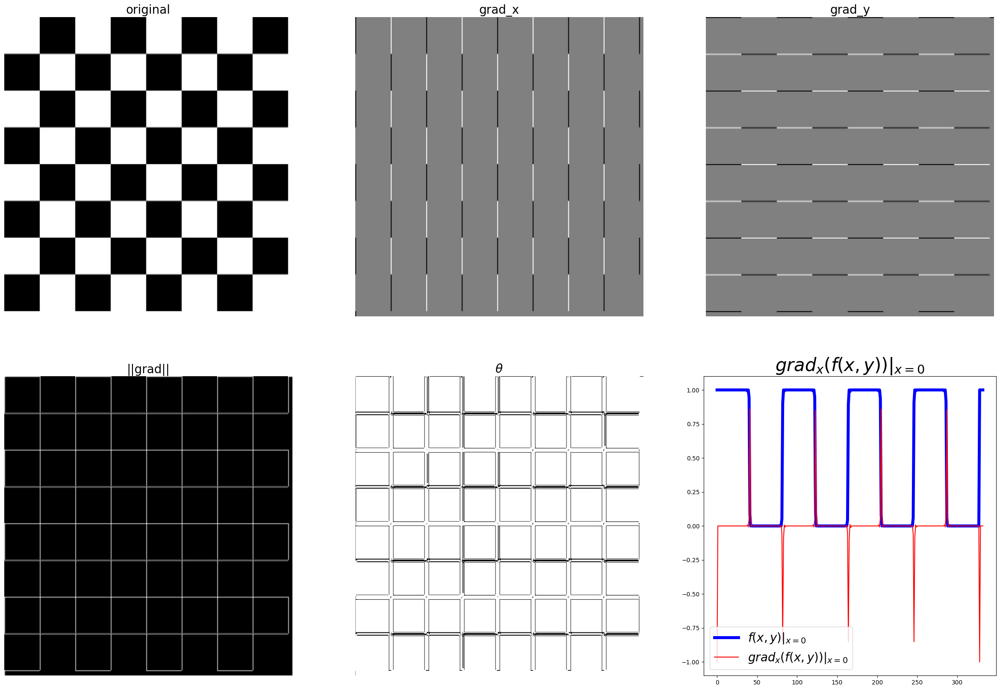

In [5]:
def plot_image(image, title):
    pylab.imshow(image)
    pylab.title(title, size=20)
    pylab.axis('off')

# Đọc ảnh và kiểm tra số lượng kênh
im = imread('D:/ĐH/Xử lý ảnh/BTL/images/chess.png')

# Kiểm tra nếu ảnh có 4 kênh (RGBA), ta chỉ sử dụng 3 kênh đầu tiên (RGB)
if im.shape[2] == 4:
    im = im[:, :, :3]  # Chỉ lấy 3 kênh đầu

# Chuyển đổi ảnh sang ảnh xám
im = rgb2gray(im)

# Bộ lọc Sobel cho x và y
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]

# Tính gradient theo hướng x và y
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')

# Tính độ lớn và hướng gradient
im_mag = np.sqrt(im_x**2 + im_y**2)
im_dir = np.arctan(im_y/im_x)

# Vẽ các hình ảnh
pylab.gray()
pylab.figure(figsize=(30,20))

pylab.subplot(231), plot_image(im, 'original')
pylab.subplot(232), plot_image(im_x, 'grad_x')
pylab.subplot(233), plot_image(im_y, 'grad_y')
pylab.subplot(234), plot_image(im_mag, '||grad||')
pylab.subplot(235), plot_image(im_dir, r'$\theta$')

# Vẽ đường biểu diễn theo chiều x tại y = 0
pylab.subplot(236)
pylab.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
pylab.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')

# Tiêu đề và hiển thị chú thích
pylab.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
pylab.legend(prop={'size': 20})

# Hiển thị tất cả hình ảnh
pylab.show()

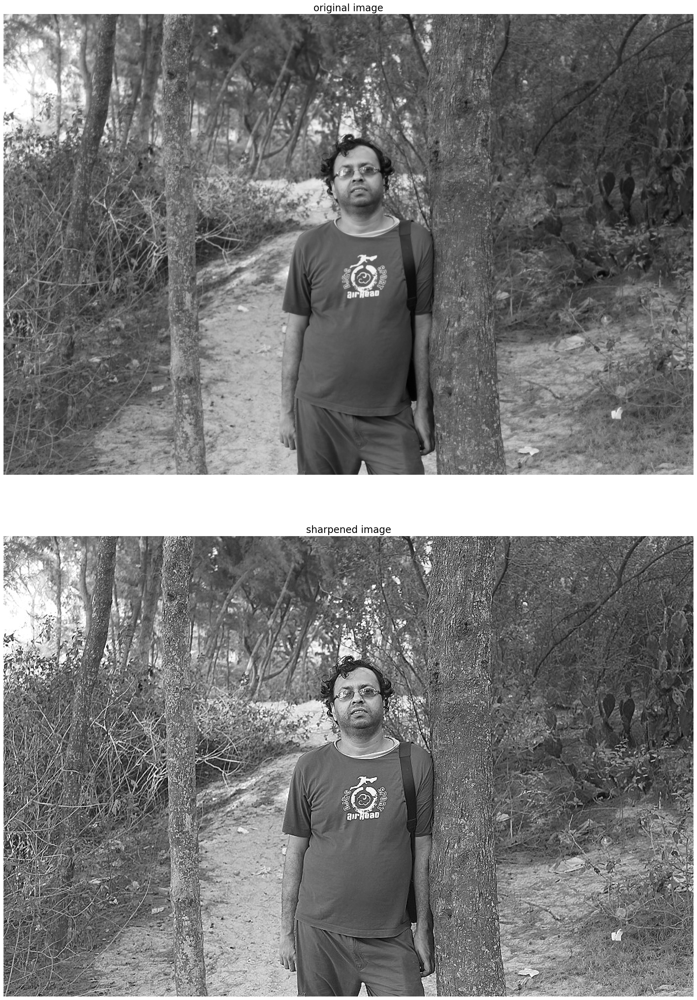

In [8]:
from skimage.filters import laplace
im = rgb2gray(imread('D:/ĐH/Xử lý ảnh/BTL/images/me8.jpg'))
im1 = np.clip(laplace(im) + im, 0, 1)
pylab.figure(figsize=(20,30))
pylab.subplot(211), plot_image(im, 'original image')
pylab.subplot(212), plot_image(im1, 'sharpened image')
pylab.tight_layout()
pylab.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_36072\1231075791.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = rgb2gray(img_as_float(imageio.imread('D:/ĐH/Xử lý ảnh/BTL/images/me4.jpg')))


<Figure size 640x480 with 0 Axes>

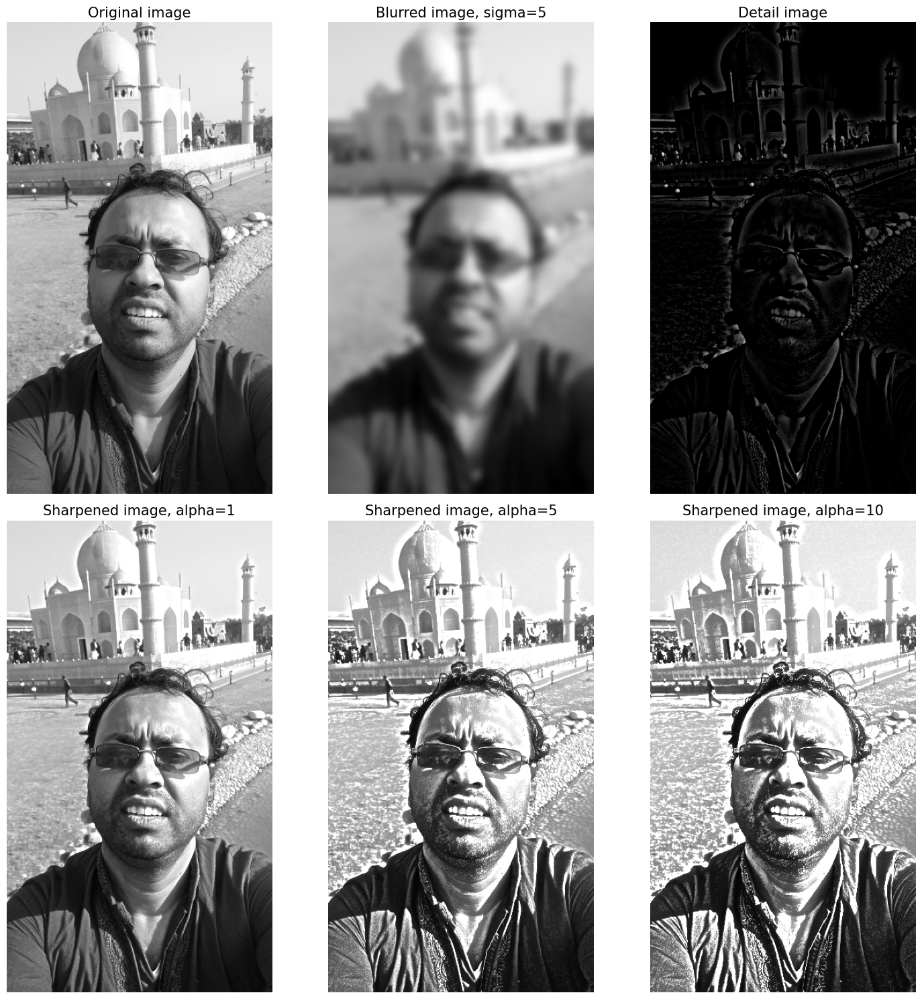

In [11]:
import imageio

def rgb2gray(im):
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

im = rgb2gray(img_as_float(imageio.imread('D:/ĐH/Xử lý ảnh/BTL/images/me4.jpg')))
im_blurred = ndimage.gaussian_filter(im, 5)
im_detail = np.clip(im - im_blurred, 0, 1)

pylab.gray()
fig, axes = pylab.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(15, 15))
axes = axes.ravel()

axes[0].set_title('Original image', size=15), axes[0].imshow(im)
axes[1].set_title('Blurred image, sigma=5', size=15), axes[1].imshow(im_blurred)
axes[2].set_title('Detail image', size=15), axes[2].imshow(im_detail)

alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp), axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)

for ax in axes:
    ax.axis('off')

fig.tight_layout()
pylab.show()


<Figure size 640x480 with 0 Axes>

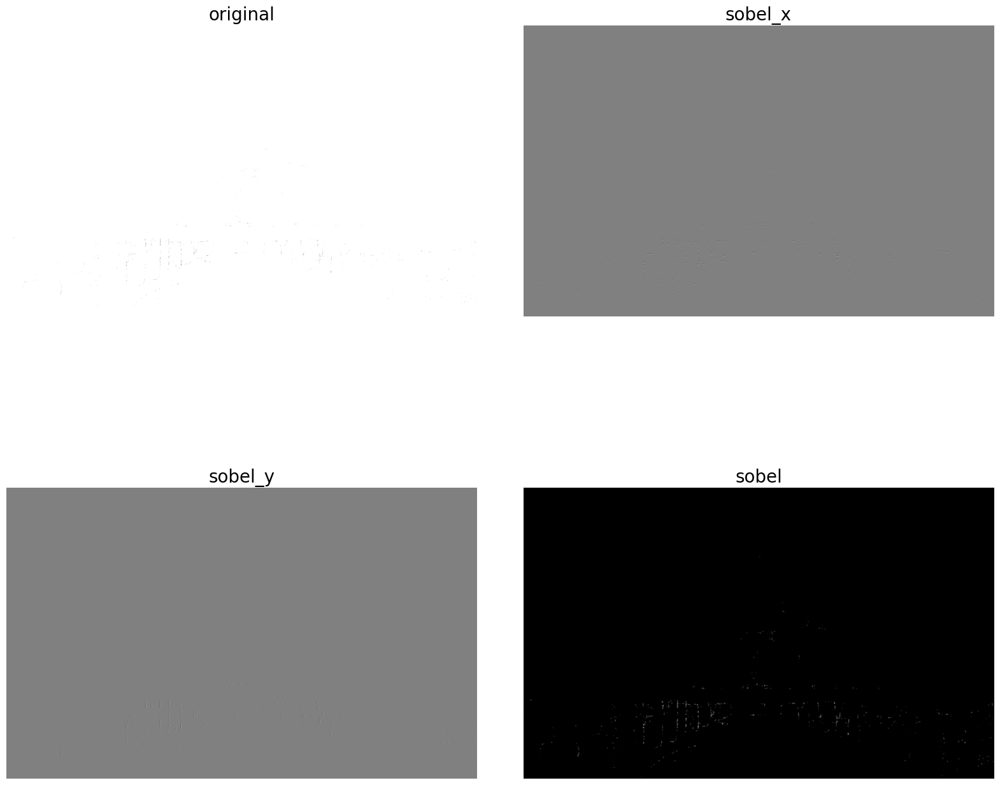

In [12]:
im = rgb2gray(imread('D:/ĐH/Xử lý ảnh/BTL/images/tajmahal.jpg')) # RGB image to gray scale
pylab.gray()
pylab.figure(figsize=(20,18))
pylab.subplot(2,2,1)
plot_image(im, 'original')
pylab.subplot(2,2,2)
edges_x = filters.sobel_h(im)
plot_image(edges_x, 'sobel_x')
pylab.subplot(2,2,3)
edges_y = filters.sobel_v(im)
plot_image(edges_y, 'sobel_y')
pylab.subplot(2,2,4)
edges = filters.sobel(im)
plot_image(edges, 'sobel')
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

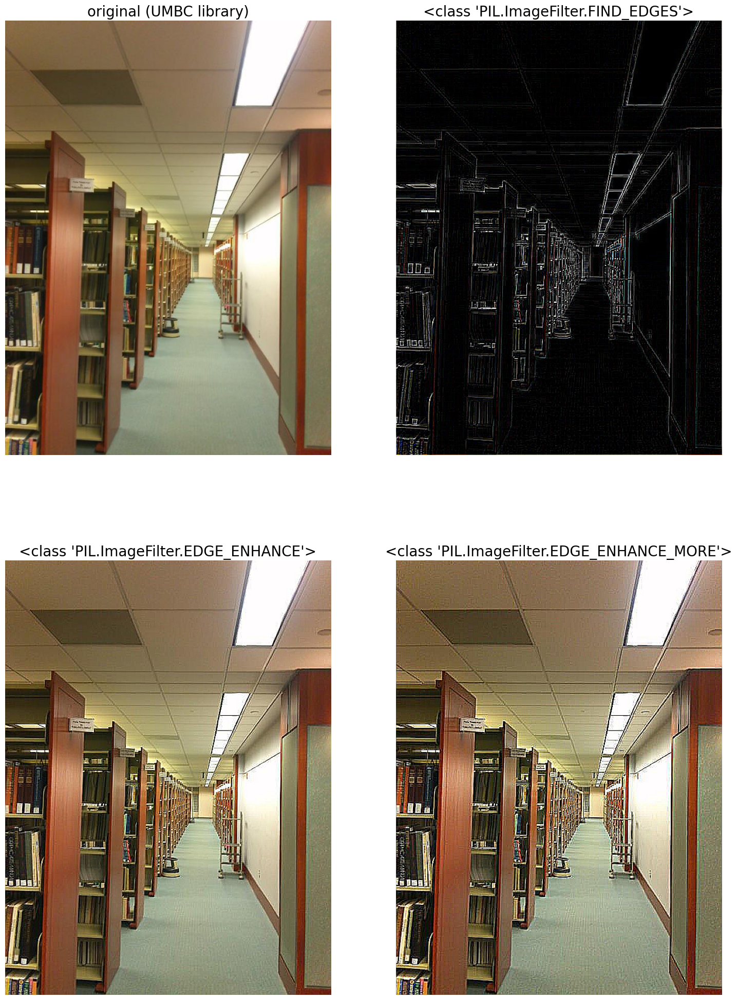

In [13]:
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
im = Image.open('D:/ĐH/Xử lý ảnh/BTL/images/umbc_lib.jpg')
pylab.figure(figsize=(18,25))
pylab.subplot(2,2,1)
plot_image(im, 'original (UMBC library)')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    pylab.subplot(2,2,i)
    im1 = im.filter(f)
    plot_image(im1, str(f))
    i += 1
pylab.show()